In [539]:
from IPython.display import display,HTML,clear_output,Image
from IPython.core.magic import register_line_magic
@register_line_magic
def cmap_header(params):
    params=params.split('|'); string=params[0]
    if len(params)==1: 
        font_size='30'; font_family='Aladin'; cmap='Sinebow'
    elif  len(params)==2: 
        font_size=params[1]; font_family='Aladin'; cmap='Sinebow'
    elif  len(params)==3: 
        font_size=params[1]; font_family=params[2]; cmap='Sinebow'
    else: 
        font_size=params[1]; font_family=params[2]; cmap=params[3]
    html_str="""
    <head><script src='https://d3js.org/d3.v6.min.js'></script>
    </head><style>@import 'https://fonts.googleapis.com/css?family="""+\
    font_family+"""&effect=3d'; #colorized {font-family:"""+font_family+\
    """; color:white; padding-left:10px; font-size:"""+font_size+\
    """px;}</style><h1 id='colorized' class='font-effect-3d'>"""+\
    string+"""</h1><script>
    var tc=setInterval(function(){
        var now=new Date().getTime();
        var iddoc=document.getElementById('colorized');
        iddoc.style.color=d3.interpolate"""+cmap+\
    """(now%(30000)/30000);},1)</script>"""
    display(HTML(html_str))

In [540]:
%cmap_header Code Modules & Functions

In [541]:
import warnings; warnings.filterwarnings('ignore')
import tensorflow as tf,tensorflow_hub as hub
import numpy as np,pylab as pl
import os,urllib,PIL.Image,time,imageio
from IPython.core.magic import register_line_magic
file_path='https://olgabelitskaya.gitlab.io/images/'

In [542]:
def display_images(original_img,style_img,
                   file_path=file_path):    
    fig=pl.figure(figsize=(10,5))
    ax=fig.add_subplot(121)
    str1='Shape of the original image: %s'
    pl.title(str1%str(original_img.shape),fontsize=int(8))
    ax.imshow(np.squeeze(original_img))
    ax=fig.add_subplot(122)
    str2='Shape of the style image: %s'
    pl.title(str2%str(style_img.shape),fontsize=int(8))
    ax.imshow(np.squeeze(style_img))
    pl.tight_layout(); pl.show()
def load_img(path_to_img):
    img=tf.io.read_file(path_to_img)
    img=tf.image.decode_image(img,channels=3)
    img=tf.image.convert_image_dtype(img,tf.float32)
    shape=tf.cast(tf.shape(img)[:-1],tf.float32)
    return img[tf.newaxis,:]
def preprocess_img(img,img_size):
    shape=tf.cast(tf.shape(img)[1:-1],tf.float32)
    new_shape=tf.cast(shape*img_size/min(shape),tf.int32)
    img=tf.image.resize(img,new_shape)
    img=tf.keras.preprocessing.image.smart_resize(
        np.squeeze(img),(img_size,img_size))
    return img[tf.newaxis,:]
def tensor2img(tensor):
    tensor=tensor*255
    tensor=np.array(tensor,dtype=np.uint8)
    if np.ndim(tensor)>3:
        assert tensor.shape[0]==1
        tensor=tensor[0]
    return PIL.Image.fromarray(tensor)

In [543]:
%cmap_header Image Data

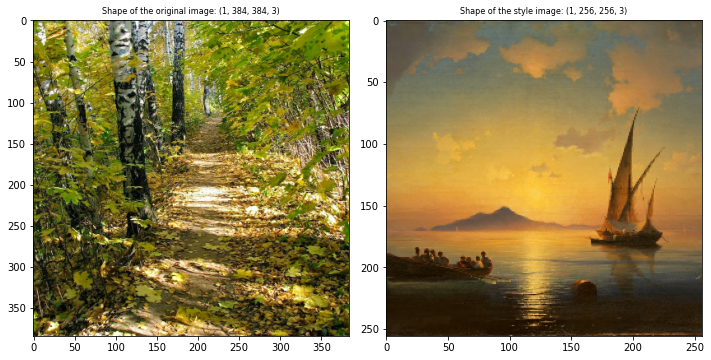

In [544]:
original,style='01_011.png','06_001.png'
original=tf.keras.utils.get_file(original,file_path+original)
style=tf.keras.utils.get_file(style,file_path+style)
original_img=load_img(original)
style_img=load_img(style)
prepro_original_img=preprocess_img(original_img,384)
prepro_style_img=preprocess_img(style_img,256)
display_images(prepro_original_img,prepro_style_img)

In [545]:
%cmap_header Pre-Trained Lite Models

In [546]:
style_predict_path=tf.keras.utils.get_file(
    'style_predict.tflite',
    'https://tfhub.dev/google/lite-model/magenta/'+\
    'arbitrary-image-stylization-v1-256/'+\
    'int8/prediction/1?lite-format=tflite')
style_transform_path=tf.keras.utils.get_file(
    'style_transform.tflite',
    'https://tfhub.dev/google/lite-model/magenta/'+\
    'arbitrary-image-stylization-v1-256/'+\
    'int8/transfer/1?lite-format=tflite')

In [547]:
def style_predict(prepro_style_img):
  interpreter=tf.lite.Interpreter(
      model_path=style_predict_path)
  interpreter.allocate_tensors()
  input_details=interpreter.get_input_details()
  interpreter.set_tensor(
      input_details[0]['index'],prepro_style_img)
  interpreter.invoke()
  style_bottleneck=interpreter.tensor(
      interpreter.get_output_details()[0]['index'])()
  return style_bottleneck
style_bottleneck=style_predict(prepro_style_img)
print('Style Bottleneck Shape:',style_bottleneck.shape)

Style Bottleneck Shape: (1, 1, 1, 100)


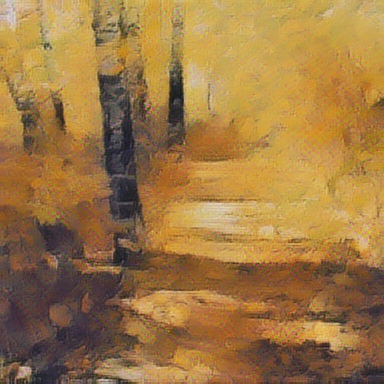

In [548]:
def style_transform(style_bottleneck,prepro_original_img):
  interpreter=tf.lite.Interpreter(
      model_path=style_transform_path)
  input_details=interpreter.get_input_details()
  interpreter.allocate_tensors()
  interpreter.set_tensor(
      input_details[0]['index'],prepro_original_img)
  interpreter.set_tensor(
      input_details[1]['index'],style_bottleneck)
  interpreter.invoke()
  stylized_img=interpreter.tensor(
      interpreter.get_output_details()[0]['index'])()
  return stylized_img
stylized_img=style_transform(
    style_bottleneck,prepro_original_img)
tensor2img(stylized_img)

In [549]:
%cmap_header Style Blending

In [550]:
style_bottleneck_original=style_predict(
    preprocess_img(original_img,256))

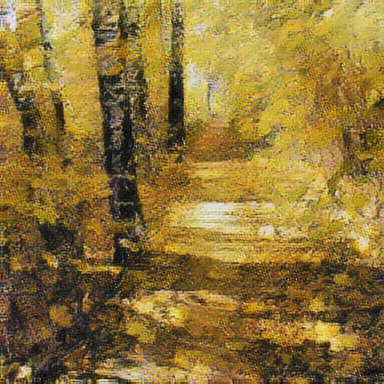

In [551]:
original_blending_ratio=.5
style_bottleneck_blended=\
original_blending_ratio*style_bottleneck_original+\
(1-original_blending_ratio)*style_bottleneck
stylized_img_blended=style_transform(
    style_bottleneck_blended,prepro_original_img)
tensor2img(stylized_img_blended)

In [552]:
%cmap_header Style Original Interpolation

In [553]:
def interpolate_hypersphere(v1,v2,steps):
    v1norm=np.linalg.norm(v1)
    v2norm=np.linalg.norm(v2)
    v2normalized=v2*(v1norm/v2norm)
    vectors=[]
    for step in range(steps):
        interpolated=v1+(v2normalized-v1)*step/(steps-int(1))
        interpolated_norm=np.linalg.norm(interpolated)
        interpolated_normalized=\
        interpolated*(v1norm/interpolated_norm)
        vectors.append(interpolated_normalized)
    return np.array(vectors)

In [554]:
prepro_style_img=preprocess_img(style_img,384)
steps=30
imgs=np.vstack(
    [interpolate_hypersphere(
        np.squeeze(prepro_original_img),
        np.squeeze(prepro_style_img),steps),
     interpolate_hypersphere(
         np.squeeze(prepro_style_img),
         np.squeeze(prepro_original_img),2*steps)])

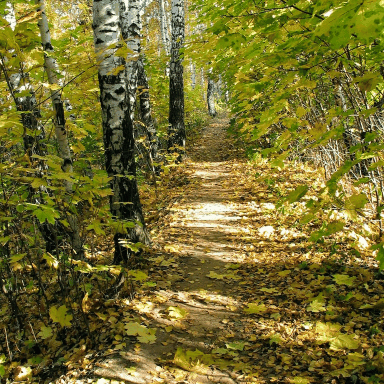

In [555]:
file_name='pic.gif'
imgs=imgs*255
imgs=np.array(imgs,dtype=np.uint8)
imageio.mimsave(file_name,imgs)
Image(open('pic.gif','rb').read())